In [1]:
import os
os.environ["CURL_CA_BUNDLE"]=""
os.environ['REQUESTS_CA_BUNDLE'] = ''
import ssl
ssl._create_default_https_context = ssl._create_unverified_context
os.environ["CUDA_VISIBLE_DEVICES"]="0"

import torch
from PIL import Image
from torchvision import transforms
import os
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from diffuser_helpers_cond_uncond_lora import extract_lora_diffusers, StableDiffusionPipeline, predict_noise0_diffuser

device = "cuda:0"

# set the path to the experiment directory
dir = 'starwar'

# set paths to endpoint images
input_image_1 = f"./image/ana1.png"
input_image_2 = f"./image/ana2.png"

# use the a common prompt for valid interpolation
# if you are morphing inter-class images, you shall set the prompt as 'an image of a <cls1> <cls2>' or 'an image of a <common-root-class>'
# e.g., 'an image of an animal' for cat and dog, 'an image of a poker man' for poker and man
prompt1 = 'photo of a man' 
prompt2 = 'photo of a man' 
lpips_delta=0.2 # delta lpips for perceptually uniform search
# Generation parameters
min_scale=1.5
max_scale=3
# choosing large inversion_step (250) is not clearly superior than smaller one (50)
inversion_steps = 250
sampling_steps=16

/usr/lib/python3/dist-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/usr/lib/python3/dist-packages/torchvision/image.so: undefined symbol: _ZN3c104cuda20CUDACachingAllocator9allocatorE'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
WARNING[XFORMERS]: xFormers can't load C++/CUDA extensions. xFormers was built for:
    PyTorch 2.0.0+cu118 with CUDA 1108 (you have 1.13.1+cu117)
    Python  3.10.10 (you have 3.10.12)
  Please reinstall xformers (see https://github.com/facebookresearch/xformers#installing-xformers)
  Memory-efficient attention, SwiGLU, sparse and more won't be available.
  Set XFORMERS_MORE_DETAILS=1 for more details
/home/de723641/impus_code/IMPUS-main/diffuser_helpers_cond_uncond_lora.py:92: FutureWarning: Importing `D

In [2]:
import random
import os
def seed_everything(seed: int):    
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    
seed_everything(0)

In [3]:
@torch.no_grad()
def sample_model(unet, scheduler, c, scale, start_code):
    """Sample the model"""
    prev_noisy_sample = start_code
    for t in scheduler.timesteps:
        with torch.no_grad():
            noise_pred = unet(torch.cat([prev_noisy_sample] * 2), t, encoder_hidden_states=c).sample
            noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
            noise_pred = noise_pred_uncond + scale * (noise_pred_text - noise_pred_uncond)
            prev_noisy_sample = scheduler.step(noise_pred, t, prev_noisy_sample).prev_sample
    return prev_noisy_sample

@torch.no_grad()
def inverse_model(x0, unet, scheduler, c):
    """Inverse the model to get noise"""
    next_noisy_sample = x0

    for t in torch.flip(scheduler_inversion.timesteps, [0]):
        with torch.no_grad():
            noise_pred = unet(torch.cat([next_noisy_sample] * 2), t, encoder_hidden_states=c).sample
            _, noise_pred_text = noise_pred.chunk(2)
            next_noisy_sample = scheduler.step(noise_pred_text, t, next_noisy_sample).prev_sample

    return next_noisy_sample
def latents_to_imgs(latents):
    x = pipe.decode_image(latents)
    x = pipe.torch_to_numpy(x)
    x = pipe.numpy_to_pil(x)
    return x
def load_img(image, target_size=512):
    """Load an image, resize and output -1..1"""

    tform = transforms.Compose([
        transforms.Resize((512,512)),
        #transforms.CenterCrop(target_size),
        transforms.ToTensor(),
    ])
    image = tform(image)
    return 2. * image - 1.

In [4]:
# Spherical linear interpolation
# Borrowed from https://gist.github.com/dvschultz/3af50c40df002da3b751efab1daddf2c 
from torch import lerp
def slerp(t, v0, v1, DOT_THRESHOLD=0.9995):
    '''
    Spherical linear interpolation
    Args:
        t (float/np.ndarray): Float value between 0.0 and 1.0
        v0 (np.ndarray): Starting vector
        v1 (np.ndarray): Final vector
        DOT_THRESHOLD (float): Threshold for considering the two vectors as
                               colineal. Not recommended to alter this.
    Returns:
        v2 (np.ndarray): Interpolation vector between v0 and v1
    '''
    c = False
    if not isinstance(v0,np.ndarray):
        c = True
        v0 = v0.detach().cpu().numpy()
    if not isinstance(v1,np.ndarray):
        c = True
        v1 = v1.detach().cpu().numpy()
    # Copy the vectors to reuse them later
    v0_copy = np.copy(v0)
    v1_copy = np.copy(v1)
    # Normalize the vectors to get the directions and angles
    v0 = v0 / np.linalg.norm(v0)
    v1 = v1 / np.linalg.norm(v1)
    # Dot product with the normalized vectors (can't use np.dot in W)
    dot = np.sum(v0 * v1)
    # If absolute value of dot product is almost 1, vectors are ~colineal, so use lerp
    if np.abs(dot) > DOT_THRESHOLD:
        return lerp(t, v0_copy, v1_copy)
    # Calculate initial angle between v0 and v1
    theta_0 = np.arccos(dot)
    sin_theta_0 = np.sin(theta_0)
    # Angle at timestep t
    theta_t = theta_0 * t
    sin_theta_t = np.sin(theta_t)
    # Finish the slerp algorithm
    # some implementation remove sin_theta_0, doesn't make much difference
    s0 = np.sin(theta_0 - theta_t) / sin_theta_0 
    s1 = sin_theta_t / sin_theta_0
    v2 = s0 * v0_copy + s1 * v1_copy
    if c:
        res = torch.from_numpy(v2).to(device)
    else:
        res = v2
    return res

In [5]:
import lpips
class AlphaBinarySearch:
    def __init__(self, start_img, end_img, lpips_metric=lpips.LPIPS(), 
                 lpips_delta=0.1, search_tolerance=1e-2, device='cuda:0',
                 sample_method=None, load_img=load_img, verbose=True, slerp=True, 
                 quit_search_thresh=1e-8):
        
        self.start_img = start_img
        self.end_img = end_img
        self.lpips_metric = lpips_metric.to(device)  # lpips metric
        self.lpips_dist_chunk = lpips_delta # delta of every consecutive image
        self.search_tolerance = search_tolerance # tolerance for binary search error
        self.sample_method = quick_sample # (embedding, guidance scale, start noise x_T), return a PIL image object
        self.load_img = load_img # preprocess of PIL image
        self.device = device
        self.alpha_list = [0] # list of returned alpha value
        self.verbose = verbose
        self.slerp = slerp
        self.quit_search_thresh = quit_search_thresh
        
    def image_lpips(self, start_img, end_alpha, emb_1, emb_2, min_scale, max_scale, start_code1, start_code2):
        # lpips between start image and image sampled by current alpha
        new_emb2 = end_alpha * emb_2 + (1 - end_alpha) * emb_1
        start_code = slerp(end_alpha, start_code1, start_code2)
        scale = max_scale - np.abs(end_alpha - 0.5) * (max_scale-min_scale) * 2.0
        img0 = start_img
        img1 = self.sample_method(new_emb2, scale, start_code)
        if self.load_img is not None:
            img0_tensor = load_img(img0).to(self.device).unsqueeze(0)
            img1_tensor = load_img(img1).to(self.device).unsqueeze(0)
        else:
            raise NotImplementedError
        
        total_dist = self.lpips_metric(img0_tensor, img1_tensor)
        return total_dist.cpu().detach().numpy()[0][0][0][0], img1
    
    def lpips_tensor(self, img0, img1):
        img0_tensor = load_img(img0).to(self.device).unsqueeze(0)
        img1_tensor = load_img(img1).to(self.device).unsqueeze(0)
        total_dist = self.lpips_metric(img0_tensor, img1_tensor)
        return total_dist.cpu().detach().numpy()[0][0][0][0]
    
    def binary_search(self, start_img, start_alpha, end_alpha, emb_1, emb_2, 
                      min_scale, max_scale, start_code1, start_code2):
        start_alpha_temp = start_alpha
        end_alpha_temp = end_alpha
        start_mid_dist, midpoint_img = self.image_lpips(start_img, (start_alpha_temp + end_alpha) / 2, emb_1, 
                                                        emb_2, min_scale, max_scale, start_code1, start_code2)

        while np.abs(start_mid_dist - self.lpips_dist_chunk) > self.search_tolerance and \
                    np.abs(start_alpha_temp - end_alpha) > self.quit_search_thresh:
            
            if start_mid_dist > self.lpips_dist_chunk:
                end_alpha = (start_alpha_temp + end_alpha) / 2
            else:
                start_alpha_temp = (start_alpha_temp + end_alpha) / 2

            start_mid_dist, midpoint_img = self.image_lpips(start_img, (start_alpha_temp + end_alpha) / 2, 
                                                            emb_1, emb_2, min_scale, max_scale, start_code1, start_code2)

            
            if self.verbose:
                print(start_alpha_temp, end_alpha, start_mid_dist)

                
        return (start_alpha_temp + end_alpha) / 2, midpoint_img
    
    
    def search(self, emb_1, emb_2, min_scale, max_scale, start_code1, start_code2, start_alpha=0, end_alpha=1):
        end_alpha = end_alpha
        current_alpha = start_alpha
        current_img = self.start_img
        while self.lpips_tensor(current_img, self.end_img) > self.lpips_dist_chunk and \
                    np.abs(current_alpha - end_alpha) > self.quit_search_thresh:
            current_alpha, current_img = self.binary_search(current_img, current_alpha, end_alpha, 
                                                       emb_1, emb_2, min_scale, max_scale, start_code1, start_code2)

            self.alpha_list.append(current_alpha)
            
        if np.abs(self.alpha_list[-1] - 1) > self.quit_search_thresh:
            self.alpha_list = self.alpha_list + [1]
            
        return self.alpha_list # append the ending alpha

/usr/lib/python3/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/lib/python3/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /home/de723641/.local/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth


In [6]:
from diffusers import AutoencoderKL, UNet2DConditionModel
from diffusers import DDIMScheduler #, DDIMInverseScheduler
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer
model_id = "CompVis/stable-diffusion-v1-4"
dtype = torch.float32

In [7]:
### load model
print(f'load models from path: {model_id}')
# 1. Load the autoencoder model which will be used to decode the latents into image space.
vae = AutoencoderKL.from_pretrained(model_id, subfolder="vae", torch_dtype=dtype)
# 2. Load the tokenizer and text encoder to tokenize and encode the text.
tokenizer = CLIPTokenizer.from_pretrained(model_id, subfolder="tokenizer", torch_dtype=dtype)
text_encoder = CLIPTextModel.from_pretrained(model_id, subfolder="text_encoder", torch_dtype=dtype)
# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained(model_id, subfolder="unet", torch_dtype=dtype)
unet2 = UNet2DConditionModel.from_pretrained(model_id, subfolder="unet", torch_dtype=dtype)
# 4. Scheduler for training images, eta is by default 0
scheduler_training = DDIMScheduler.from_pretrained(model_id, subfolder="scheduler", torch_dtype=dtype)
# 5. Scheduler for sampling images, eta is by default 0
scheduler_sampling = DDIMScheduler.from_pretrained(model_id, subfolder="scheduler", torch_dtype=dtype)
# 6. Scheduler for inversion into noise, eta is by default 0
scheduler_inversion = DDIMScheduler.from_pretrained(model_id, subfolder="scheduler", torch_dtype=dtype)

unet = unet.to(device)
unet2 = unet2.to(device)
vae = vae.to(device)
text_encoder = text_encoder.to(device)
vae.requires_grad_(False)
text_encoder.requires_grad_(False)
unet.requires_grad_(False)
unet2.requires_grad_(False)
print(f'load models from path: {model_id}')

load models from path: CompVis/stable-diffusion-v1-4


/usr/lib/python3/dist-packages/urllib3/connectionpool.py:1020: InsecureRequestWarning: Unverified HTTPS request is being made to host 'pitc-zscaler-global-3prz.proxy.corporate.ge.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
/usr/lib/python3/dist-packages/urllib3/connectionpool.py:1020: InsecureRequestWarning: Unverified HTTPS request is being made to host 'pitc-zscaler-global-3prz.proxy.corporate.ge.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
/usr/lib/python3/dist-packages/urllib3/connectionpool.py:1020: InsecureRequestWarning: Unverified HTTPS request is being made to host 'pitc-zscaler-global-3prz.proxy.corporate.ge.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn

load models from path: CompVis/stable-diffusion-v1-4


In [8]:
image_1 = Image.open(input_image_1).convert("RGB")
init_image_1 = load_img(image_1).to(device).unsqueeze(0)
init_latent_1 = vae.config.scaling_factor * vae.encode(init_image_1).latent_dist.sample()
#img1 = decode_to_im(init_latent_1).show()

image_2 = Image.open(input_image_2).convert("RGB")
init_image_2 = load_img(image_2).to(device).unsqueeze(0)
init_latent_2 = vae.config.scaling_factor * vae.encode(init_image_2).latent_dist.sample()
#img2 = decode_to_im(init_latent_2).show()

text_input1 = tokenizer([prompt1], padding="max_length",
                       max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
text_input2 = tokenizer([prompt2], padding="max_length",
                       max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
max_length1 = text_input1.input_ids.shape[-1]
max_length2 = text_input2.input_ids.shape[-1]

uncond_input = tokenizer(
    [""], padding="max_length", max_length=max(max_length1,max_length2),
    return_tensors="pt"
)

with torch.no_grad():
    text_emb1 = text_encoder(text_input1.input_ids.to(device))[0]
    text_emb2 = text_encoder(text_input2.input_ids.to(device))[0]
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(device))[0]

orig_emb1 = torch.cat([uncond_embeddings, text_emb1])
#print(orig_emb1.shape) torch.Size([2, 77, 768])

orig_emb2 = torch.cat([uncond_embeddings, text_emb2])
emb_1 = orig_emb1.clone()
emb_2 = orig_emb2.clone()


# Textual Inversion


In [9]:
emb_1.requires_grad = True
emb_2.requires_grad = True
lr = 2e-3
it = 2500
start_code = torch.randn_like(init_latent_1)
num_train_timesteps = len(scheduler_training.betas)
scheduler_training.set_timesteps(num_train_timesteps)
scheduler_sampling.set_timesteps(sampling_steps)
scheduler_inversion.set_timesteps(inversion_steps)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [06:15<00:00,  6.67it/s, loss=0.0713]


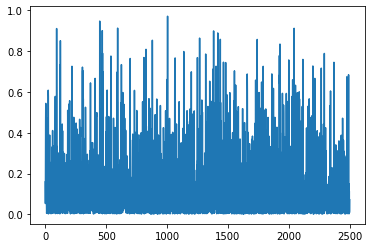

In [10]:
opt = torch.optim.Adam([emb_1], lr=lr)
criteria = torch.nn.MSELoss()
history = []
pbar = tqdm(range(it))
#emb_1_copy = emb_1.clone()
for i in pbar:
    opt.zero_grad()
    noise = torch.randn_like(init_latent_1)
    t_enc = torch.randint(num_train_timesteps, (1,), device=device)
    z = scheduler_training.add_noise(init_latent_1, noise, t_enc)
    #pred_noise = unet(z, t_enc, encoder_hidden_states=emb_1).sample
    pred_noise = predict_noise0_diffuser(unet, z, emb_1, t_enc, guidance_scale=1,scheduler=scheduler_training)
    loss = criteria(pred_noise, noise)
    loss.backward()
    pbar.set_postfix({"loss": loss.item()})
    history.append(loss.item())
    opt.step()
    #print((emb_1_copy-emb_1).norm())
plt.plot(history)
plt.show()

In [11]:
torch.cuda.empty_cache()

In [12]:
#load modified diffuser pipeline for reverse diffusion
pipe = StableDiffusionPipeline(vae,text_encoder,tokenizer,unet,scheduler_sampling,scheduler_inversion)
# noise code inversion
start_code1 = pipe.forward_diffusion(
    latents=init_latent_1,
    text_embeddings=emb_1[1].unsqueeze(0),
    guidance_scale=1,
    num_inference_steps=inversion_steps,
)

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

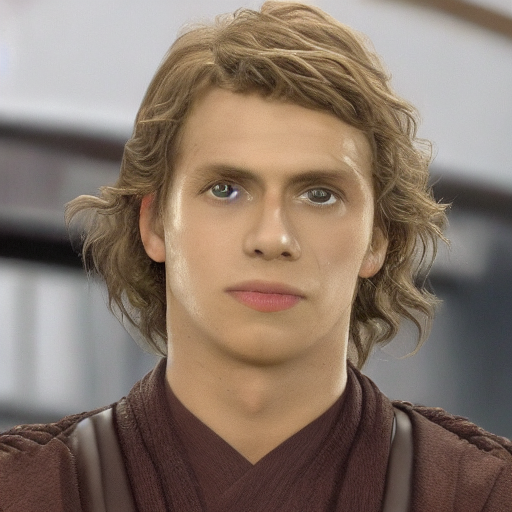

In [13]:
#random sample
x0 = pipe.backward_diffusion(
    latents=start_code,
    text_embeddings=emb_1,
    guidance_scale=min_scale,
    num_inference_steps=sampling_steps,
)
latents_to_imgs(x0)[0]#.show()

variance of inverted xT: tensor(0.9642, device='cuda:0')


  0%|          | 0/16 [00:00<?, ?it/s]

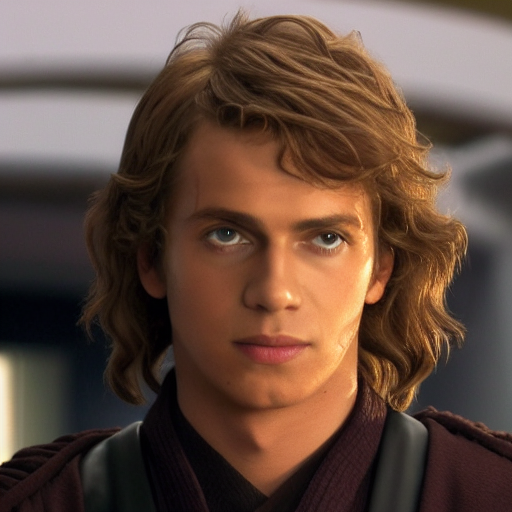

In [14]:
# sanity check for ddim inversion, should be close to 1, otherwise treated as outlier
start_code1_var = start_code1.var()
print('variance of inverted xT:', start_code1_var)
x0_1 = pipe.backward_diffusion(
    latents=start_code1,
    text_embeddings=emb_1,
    guidance_scale=min_scale,
    num_inference_steps=sampling_steps,
)
latents_to_imgs(x0_1)[0]#.show()

In [15]:
torch.cuda.empty_cache()

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [06:05<00:00,  6.85it/s, loss=0.105]


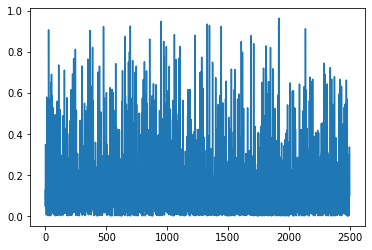

In [16]:
opt = torch.optim.Adam([emb_2], lr=lr)
criteria = torch.nn.MSELoss()
history = []
pbar = tqdm(range(it))
for i in pbar:
    opt.zero_grad()
    noise = torch.randn_like(init_latent_2)
    t_enc = torch.randint(num_train_timesteps, (1,), device=device)
    z = scheduler_training.add_noise(init_latent_2, noise, t_enc)
    pred_noise = predict_noise0_diffuser(unet, z, emb_2, t_enc, guidance_scale=1,scheduler=scheduler_training)
    loss = criteria(pred_noise, noise)
    loss.backward()
    pbar.set_postfix({"loss": loss.item()})
    history.append(loss.item())
    opt.step()

plt.plot(history)
plt.show()

In [17]:
# Noise code inversion
start_code2 = pipe.forward_diffusion(
    latents=init_latent_2,
    text_embeddings=emb_2[1].unsqueeze(0),
    guidance_scale=1,
    num_inference_steps=inversion_steps,
)

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

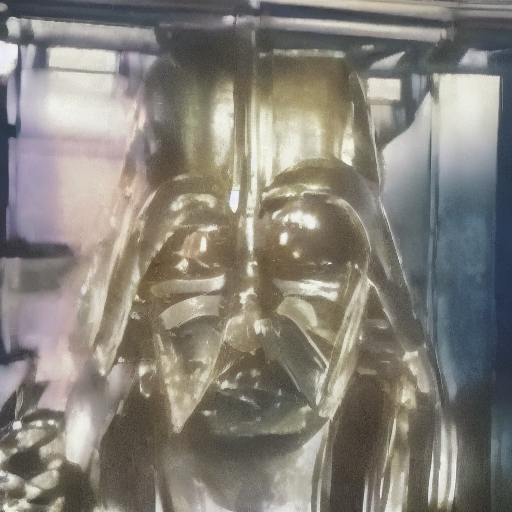

In [18]:
#random sample
x0 = pipe.backward_diffusion(
    latents=start_code,
    text_embeddings=emb_2,
    guidance_scale=min_scale,
    num_inference_steps=sampling_steps,
)
latents_to_imgs(x0)[0]

variance of inverted xT: tensor(0.9832, device='cuda:0')


  0%|          | 0/16 [00:00<?, ?it/s]

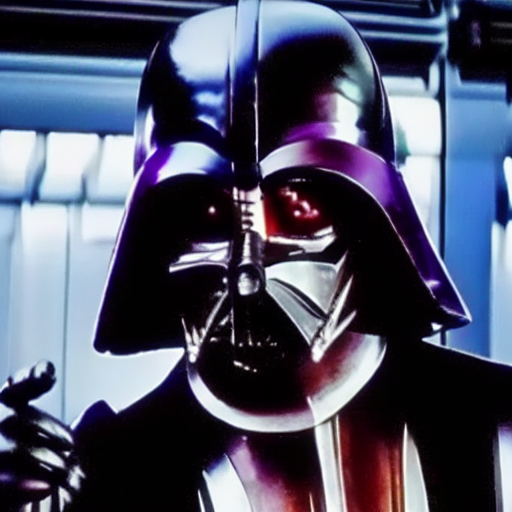

In [19]:
# sanity check for ddim inversion, should be close to 1, otherwise treated as outlier
start_code2_var = start_code2.var()
print('variance of inverted xT:', start_code2_var)
x0_2 = pipe.backward_diffusion(
    latents=start_code2,
    text_embeddings=emb_2,
    guidance_scale=max_scale,
    num_inference_steps=sampling_steps,
)
latents_to_imgs(x0_2)[0]#.show()

In [20]:
if not os.path.exists(f'./{dir}/'):
    os.mkdir(f'./{dir}/')    
torch.save(emb_1, f'./{dir}/emb_1.pt')
torch.save(emb_2, f'./{dir}/emb_2.pt')

In [21]:
emb_1 = torch.load(f'./{dir}/emb_1.pt').to(device).detach()
emb_2 = torch.load(f'./{dir}/emb_2.pt').to(device).detach()

In [22]:
import lpips
loss_fn_vgg = lpips.LPIPS(net='alex').to(device)
total_lpips = 0.0

x_prev = pipe.decode_image(x0_1)

for alpha_i in range(1, 11, 1):
    alpha = alpha_i / 10
    new_emb = alpha*emb_1 + (1-alpha)*emb_2
    start_code = slerp(1-alpha, start_code1, start_code2)
    x0 = pipe.backward_diffusion(
    latents=start_code,
    text_embeddings=new_emb,
    guidance_scale=max_scale,
    num_inference_steps=sampling_steps,)
    x_next = pipe.decode_image(x0)
    total_lpips += loss_fn_vgg(x_prev, x_next)
    x_prev = x_next

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /home/de723641/.local/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [23]:
total_lpips

tensor([[[[3.0703]]]], device='cuda:0', grad_fn=<AddBackward0>)

In [24]:
# heuristic for LoRA rank
rPPD = total_lpips / (9 * loss_fn_vgg(pipe.decode_image(x0_1), pipe.decode_image(x0_2)))
rPPD = rPPD.squeeze().item()
print('relative Perceptual Path Diversity', rPPD)
LORA_RANK = int(2 ** (max(0, int(18 * rPPD - 6))))

# LoRA rank is set as at least 16 for outliers
if torch.abs(start_code1_var-start_code2_var) > 0.1 and torch.min(start_code1_var, start_code2_var)<0.9:
    LORA_RANK = max(16, LORA_RANK)

relative Perceptual Path Diversity 0.4658783972263336


In [25]:
LORA_RANK

4

# Model fine tune with target and optimized embedding via LoRA

In [26]:
import random

def seed_everything(seed: int):    
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    
seed_everything(999)

In [27]:
LORA_RANK_uncond = 2

In [28]:
unet = unet.eval()
unet2 = unet2.eval()

In [29]:
torch.cuda.empty_cache()
lr = 1e-3
unet_lora, unet_lora_layers = extract_lora_diffusers(unet, device, rank = LORA_RANK)
lora_params = list(unet_lora_layers.parameters())
unet_lora.to(device)
opt = torch.optim.AdamW([{"params": lora_params, "lr": lr}], lr=lr)
print(f'number of trainable parameters of LoRA model in optimizer: {sum(p.numel() for p in lora_params if p.requires_grad)}')

number of trainable parameters of LoRA model in optimizer: 797184


In [30]:
params = list(unet.parameters())
print(f'number of total parameters of model in optimizer: {sum(p.numel() for p in params)}')

number of total parameters of model in optimizer: 860318148


In [31]:
emb_1.requires_grad = False
emb_2.requires_grad = False
unet_lora.train()
it = 150
criteria = torch.nn.MSELoss()
history = []

pbar = tqdm(range(it))
for i in pbar:
    opt.zero_grad()
    noise = torch.randn_like(init_latent_1)
    t_enc = torch.randint(num_train_timesteps, (1,), device=device)
    #z = model.q_sample(init_latent_1, t_enc, noise=noise)
    z = scheduler_training.add_noise(init_latent_1, noise, t_enc)
    #pred_noise = model.apply_model(z, t_enc, emb_1)
    pred_noise = predict_noise0_diffuser(unet_lora, z, emb_1, t_enc, guidance_scale=1,
                                         scheduler=scheduler_training,cross_attention_kwargs = {'scale': 1})
    loss = criteria(pred_noise, noise)
    loss.backward()
    
    # prior preserve embedding - joint optimzation with generate image (bird spread wings)
    noise = torch.randn_like(init_latent_2)
    t_enc = torch.randint(num_train_timesteps, (1,), device=device)
    #z = model.q_sample(init_latent_2, t_enc, noise=noise)
    z = scheduler_training.add_noise(init_latent_2, noise, t_enc)
    #pred_noise = model.apply_model(z, t_enc, emb_2)
    pred_noise = predict_noise0_diffuser(unet_lora, z, emb_2, t_enc, guidance_scale=1,
                                         scheduler=scheduler_training,cross_attention_kwargs = {'scale': 1})
    loss = criteria(pred_noise, noise)
    loss.backward()
    
    pbar.set_postfix({"loss": loss.item()})
    history.append(loss.item())
    opt.step()

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 150/150 [00:52<00:00,  2.88it/s, loss=0.163]


# Fine tune the unconditional score

In [32]:
torch.cuda.empty_cache()
lr = 1e-3
unet_lora_uncond, unet_lora_layers_uncond = extract_lora_diffusers(unet2, device, rank = LORA_RANK_uncond)
lora_params_uncond = list(unet_lora_layers_uncond.parameters())
unet_lora_uncond.to(device)
opt = torch.optim.AdamW([{"params": lora_params_uncond, "lr": lr}], lr=lr)
print(f'number of trainable parameters of LoRA model in optimizer: {sum(p.numel() for p in lora_params_uncond if p.requires_grad)}')
#unet_lora.load_attn_procs(PATH_TO_LORA_WEIGHTS)

number of trainable parameters of LoRA model in optimizer: 398592


In [33]:
emb_1.requires_grad = False
emb_2.requires_grad = False
unet_lora_uncond.train()
it = 15
criteria = torch.nn.MSELoss()
history = []

pbar = tqdm(range(it))
for i in pbar:
    opt.zero_grad()
    noise = torch.randn_like(init_latent_1)
    t_enc = torch.randint(num_train_timesteps, (1,), device=device)
    #z = model.q_sample(init_latent_1, t_enc, noise=noise)
    z = scheduler_training.add_noise(init_latent_1, noise, t_enc)
    #pred_noise = model.apply_model(z, t_enc, emb_1)
    pred_noise = predict_noise0_diffuser(unet_lora_uncond, z, torch.concat([uncond_embeddings, uncond_embeddings]), 
                                         t_enc, guidance_scale=1,
                                         scheduler=scheduler_training,cross_attention_kwargs = {'scale': 1})
    loss = criteria(pred_noise, noise)
    loss.backward()
    
    # prior preserve embedding - joint optimzation with generate image (bird spread wings)
    noise = torch.randn_like(init_latent_2)
    t_enc = torch.randint(num_train_timesteps, (1,), device=device)
    #z = model.q_sample(init_latent_2, t_enc, noise=noise)
    z = scheduler_training.add_noise(init_latent_2, noise, t_enc)
    #pred_noise = model.apply_model(z, t_enc, emb_2)
    pred_noise = predict_noise0_diffuser(unet_lora_uncond, z, torch.concat([uncond_embeddings, uncond_embeddings]), 
                                         t_enc, guidance_scale=1,
                                         scheduler=scheduler_training,cross_attention_kwargs = {'scale': 1})
    loss = criteria(pred_noise, noise)
    loss.backward()
    
    pbar.set_postfix({"loss": loss.item()})
    history.append(loss.item())
    opt.step()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.86it/s, loss=0.0598]


In [34]:
unet_lora_uncond = unet_lora_uncond.eval()
unet_lora = unet_lora.eval()

In [35]:
if not os.path.exists(f'./{dir}/con_lora/'):
    os.mkdir(f'./{dir}/con_lora/')
if not os.path.exists(f'./{dir}/uncon_lora/'):
    os.mkdir(f'./{dir}/uncon_lora/')    
unet_lora.save_attn_procs(save_directory=f'./{dir}/con_lora/')
unet_lora_uncond.save_attn_procs(save_directory=f'./{dir}/uncon_lora/')


# Get initial code

In [36]:
#load modified diffuser pipeline for reverse diffusion
pipe = StableDiffusionPipeline(vae,text_encoder,tokenizer,unet_lora,scheduler_sampling,
                               scheduler_inversion, unet_uncond=unet_lora_uncond)

In [37]:
start_code1 = pipe.forward_diffusion(
    latents=init_latent_1,
    text_embeddings=emb_1[1].unsqueeze(0),
    guidance_scale=1,
    num_inference_steps=250,
)

  0%|          | 0/250 [00:00<?, ?it/s]

variance of inverted xT: tensor(0.9588, device='cuda:0')


  0%|          | 0/16 [00:00<?, ?it/s]

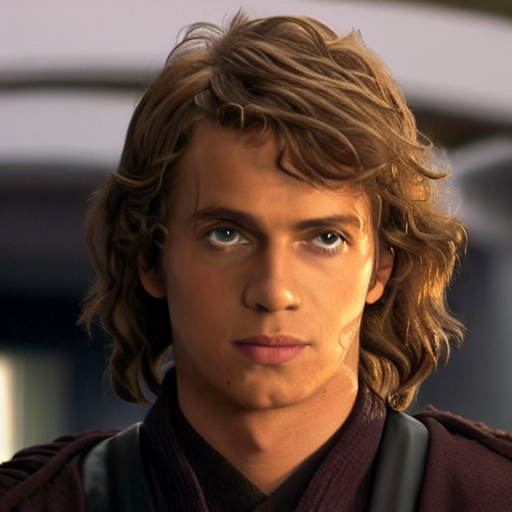

In [38]:
#sanity check for ddim inversion, should be close to 1
print('variance of inverted xT:', start_code1.var())
x0 = pipe.backward_diffusion(
    latents=start_code1,
    text_embeddings=emb_1,
    guidance_scale=min_scale,
    num_inference_steps=sampling_steps,
    use_unet_uncon=True
)
start_img = latents_to_imgs(x0)[0]#.show()
start_img

In [39]:
start_code2 = pipe.forward_diffusion(
    latents=init_latent_2,
    text_embeddings=emb_2[1].unsqueeze(0),
    guidance_scale=1,
    num_inference_steps=250,
)

  0%|          | 0/250 [00:00<?, ?it/s]

variance of inverted xT: tensor(1.0078, device='cuda:0')


  0%|          | 0/16 [00:00<?, ?it/s]

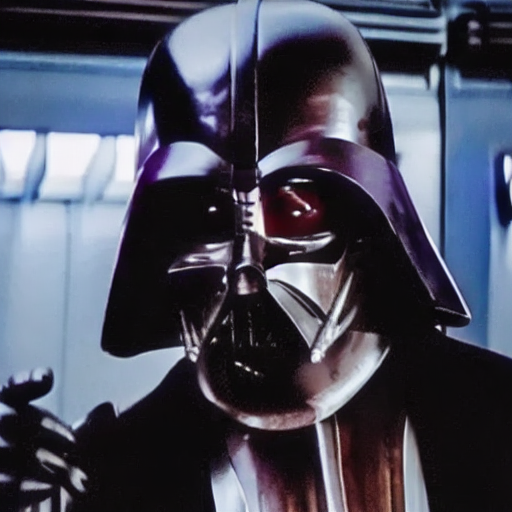

In [40]:
#sanity check for ddim inversion, should be close to 1
print('variance of inverted xT:', start_code2.var())
x0 = pipe.backward_diffusion(
    latents=start_code2,
    text_embeddings=emb_2,
    guidance_scale=min_scale,
    num_inference_steps=sampling_steps,
    use_unet_uncon=True
)
end_img = latents_to_imgs(x0)[0]#.show()
end_img

# Perceptually Uniform Interpolation

In [41]:
def quick_sample(emb, scale, start_code):
    # return a PIL image object
    x0 = pipe.backward_diffusion(
                latents=start_code,
                text_embeddings=emb,
                guidance_scale=scale,
                num_inference_steps=sampling_steps,
                use_unet_uncon=True)
    return latents_to_imgs(x0)[0]

sampling_alpha = AlphaBinarySearch(start_img, end_img, lpips_delta=lpips_delta, search_tolerance=1e-2,
                                   sample_method=quick_sample, load_img=load_img)
alpha_list = sampling_alpha.search(emb_1, emb_2, min_scale, max_scale, start_code1, start_code2, start_alpha=0, end_alpha=1)

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0 0.5 0.18119498


  0%|          | 0/16 [00:00<?, ?it/s]

0.25 0.5 0.27217898


  0%|          | 0/16 [00:00<?, ?it/s]

0.25 0.375 0.22454941


  0%|          | 0/16 [00:00<?, ?it/s]

0.25 0.3125 0.2023603


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0.28125 0.640625 0.27641723


  0%|          | 0/16 [00:00<?, ?it/s]

0.28125 0.4609375 0.09180808


  0%|          | 0/16 [00:00<?, ?it/s]

0.37109375 0.4609375 0.17244554


  0%|          | 0/16 [00:00<?, ?it/s]

0.416015625 0.4609375 0.21161038


  0%|          | 0/16 [00:00<?, ?it/s]

0.416015625 0.4384765625 0.19297194


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0.42724609375 0.713623046875 0.5273308


  0%|          | 0/16 [00:00<?, ?it/s]

0.42724609375 0.5704345703125 0.25277564


  0%|          | 0/16 [00:00<?, ?it/s]

0.42724609375 0.49884033203125 0.1211926


  0%|          | 0/16 [00:00<?, ?it/s]

0.463043212890625 0.49884033203125 0.18233252


  0%|          | 0/16 [00:00<?, ?it/s]

0.4809417724609375 0.49884033203125 0.21866164


  0%|          | 0/16 [00:00<?, ?it/s]

0.4809417724609375 0.48989105224609375 0.20124674


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0.4854164123535156 0.7427082061767578 0.54850143


  0%|          | 0/16 [00:00<?, ?it/s]

0.4854164123535156 0.6140623092651367 0.41031554


  0%|          | 0/16 [00:00<?, ?it/s]

0.4854164123535156 0.5497393608093262 0.244369


  0%|          | 0/16 [00:00<?, ?it/s]

0.4854164123535156 0.5175778865814209 0.07837823


  0%|          | 0/16 [00:00<?, ?it/s]

0.5014971494674683 0.5175778865814209 0.17146017


  0%|          | 0/16 [00:00<?, ?it/s]

0.5095375180244446 0.5175778865814209 0.20480974


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0.5135577023029327 0.7567788511514664 0.522364


  0%|          | 0/16 [00:00<?, ?it/s]

0.5135577023029327 0.6351682767271996 0.41677916


  0%|          | 0/16 [00:00<?, ?it/s]

0.5135577023029327 0.5743629895150661 0.2847061


  0%|          | 0/16 [00:00<?, ?it/s]

0.5135577023029327 0.5439603459089994 0.1677253


  0%|          | 0/16 [00:00<?, ?it/s]

0.5287590241059661 0.5439603459089994 0.21620315


  0%|          | 0/16 [00:00<?, ?it/s]

0.5287590241059661 0.5363596850074828 0.19097462


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0.5325593545567244 0.7662796772783622 0.50178933


  0%|          | 0/16 [00:00<?, ?it/s]

0.5325593545567244 0.6494195159175433 0.42798182


  0%|          | 0/16 [00:00<?, ?it/s]

0.5325593545567244 0.5909894352371339 0.28943497


  0%|          | 0/16 [00:00<?, ?it/s]

0.5325593545567244 0.5617743948969292 0.18287262


  0%|          | 0/16 [00:00<?, ?it/s]

0.5471668747268268 0.5617743948969292 0.25191885


  0%|          | 0/16 [00:00<?, ?it/s]

0.5471668747268268 0.554470634811878 0.2235163


  0%|          | 0/16 [00:00<?, ?it/s]

0.5471668747268268 0.5508187547693524 0.2047779


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0.5489928147480896 0.7744964073740448 0.4791379


  0%|          | 0/16 [00:00<?, ?it/s]

0.5489928147480896 0.6617446110610672 0.39704245


  0%|          | 0/16 [00:00<?, ?it/s]

0.5489928147480896 0.6053687129045784 0.27544335


  0%|          | 0/16 [00:00<?, ?it/s]

0.5489928147480896 0.577180763826334 0.15553708


  0%|          | 0/16 [00:00<?, ?it/s]

0.5630867892872118 0.577180763826334 0.21453738


  0%|          | 0/16 [00:00<?, ?it/s]

0.5630867892872118 0.5701337765567729 0.1869045


  0%|          | 0/16 [00:00<?, ?it/s]

0.5666102829219923 0.5701337765567729 0.20092863


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0.5683720297393826 0.7841860148696913 0.44358748


  0%|          | 0/16 [00:00<?, ?it/s]

0.5683720297393826 0.676279022304537 0.35974723


  0%|          | 0/16 [00:00<?, ?it/s]

0.5683720297393826 0.6223255260219598 0.30176303


  0%|          | 0/16 [00:00<?, ?it/s]

0.5683720297393826 0.5953487778806712 0.22098188


  0%|          | 0/16 [00:00<?, ?it/s]

0.5683720297393826 0.5818604038100269 0.11388259


  0%|          | 0/16 [00:00<?, ?it/s]

0.5751162167747048 0.5818604038100269 0.17792292


  0%|          | 0/16 [00:00<?, ?it/s]

0.5784883102923659 0.5818604038100269 0.2051473


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0.5801743570511964 0.7900871785255982 0.42396355


  0%|          | 0/16 [00:00<?, ?it/s]

0.5801743570511964 0.6851307677883973 0.29980093


  0%|          | 0/16 [00:00<?, ?it/s]

0.5801743570511964 0.6326525624197968 0.20996082


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0.6064134597354967 0.8032067298677483 0.4038193


  0%|          | 0/16 [00:00<?, ?it/s]

0.6064134597354967 0.7048100948016225 0.2910603


  0%|          | 0/16 [00:00<?, ?it/s]

0.6064134597354967 0.6556117772685596 0.16227719


  0%|          | 0/16 [00:00<?, ?it/s]

0.6310126185020282 0.6556117772685596 0.21744545


  0%|          | 0/16 [00:00<?, ?it/s]

0.6310126185020282 0.6433121978852938 0.1826591


  0%|          | 0/16 [00:00<?, ?it/s]

0.637162408193661 0.6433121978852938 0.1942386


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0.6402373030394775 0.8201186515197387 0.385805


  0%|          | 0/16 [00:00<?, ?it/s]

0.6402373030394775 0.7301779772796081 0.2683291


  0%|          | 0/16 [00:00<?, ?it/s]

0.6402373030394775 0.6852076401595428 0.1859694


  0%|          | 0/16 [00:00<?, ?it/s]

0.6627224715995101 0.6852076401595428 0.22384128


  0%|          | 0/16 [00:00<?, ?it/s]

0.6627224715995101 0.6739650558795265 0.2060056


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0.6683437637395183 0.8341718818697592 0.35915095


  0%|          | 0/16 [00:00<?, ?it/s]

0.6683437637395183 0.7512578228046387 0.25550857


  0%|          | 0/16 [00:00<?, ?it/s]

0.6683437637395183 0.7098007932720785 0.14721292


  0%|          | 0/16 [00:00<?, ?it/s]

0.6890722785057983 0.7098007932720785 0.20978981


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0.6994365358889384 0.8497182679444693 0.29419607


  0%|          | 0/16 [00:00<?, ?it/s]

0.6994365358889384 0.7745774019167038 0.18518707


  0%|          | 0/16 [00:00<?, ?it/s]

0.7370069689028211 0.7745774019167038 0.23803902


  0%|          | 0/16 [00:00<?, ?it/s]

0.7370069689028211 0.7557921854097625 0.21540487


  0%|          | 0/16 [00:00<?, ?it/s]

0.7370069689028211 0.7463995771562918 0.20049074


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0.7417032730295565 0.8708516365147783 0.20115419


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

0.9031387273860837 1 0.1818561


  0%|          | 0/16 [00:00<?, ?it/s]

0.9515693636930418 1 0.19588305


In [42]:
len(alpha_list)

17

alpha: 0


  0%|          | 0/16 [00:00<?, ?it/s]

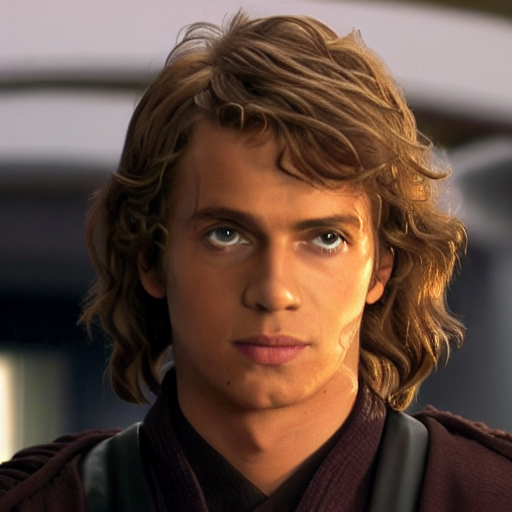

alpha: 0.28125


  0%|          | 0/16 [00:00<?, ?it/s]

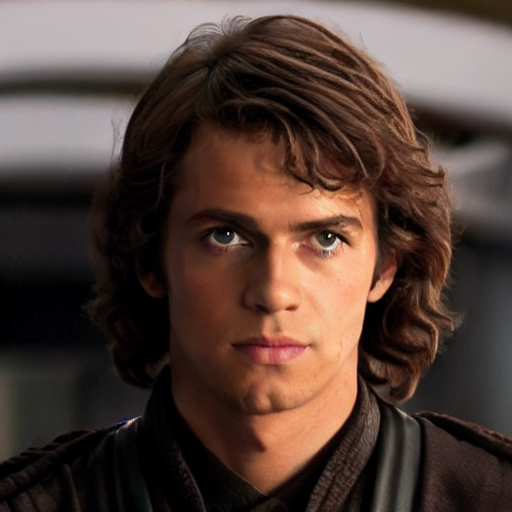

alpha: 0.42724609375


  0%|          | 0/16 [00:00<?, ?it/s]

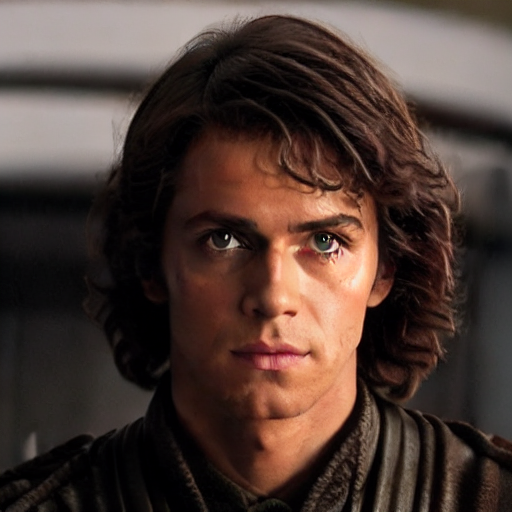

alpha: 0.4854164123535156


  0%|          | 0/16 [00:00<?, ?it/s]

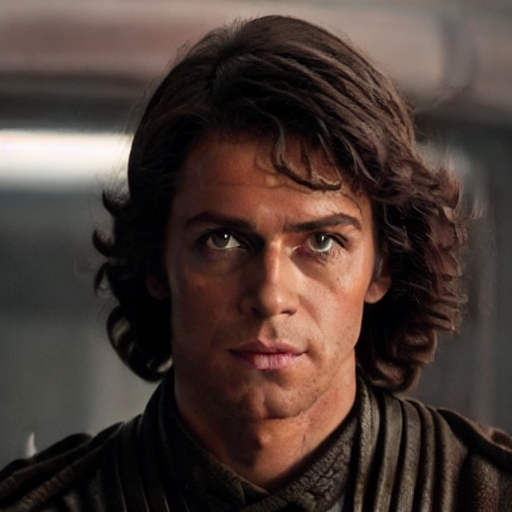

alpha: 0.5135577023029327


  0%|          | 0/16 [00:00<?, ?it/s]

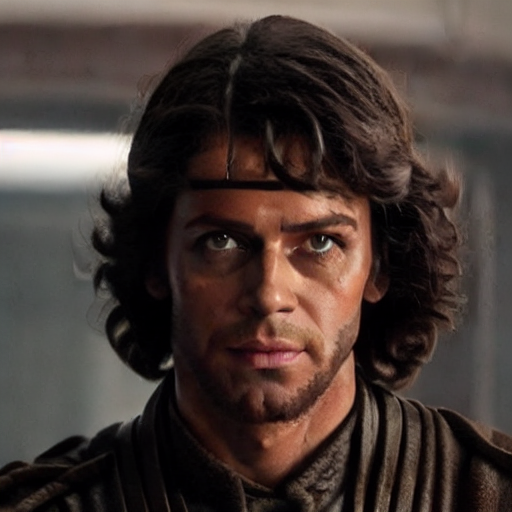

alpha: 0.5325593545567244


  0%|          | 0/16 [00:00<?, ?it/s]

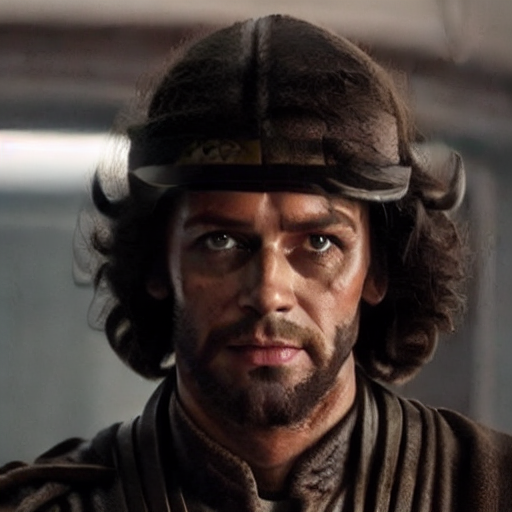

alpha: 0.5489928147480896


  0%|          | 0/16 [00:00<?, ?it/s]

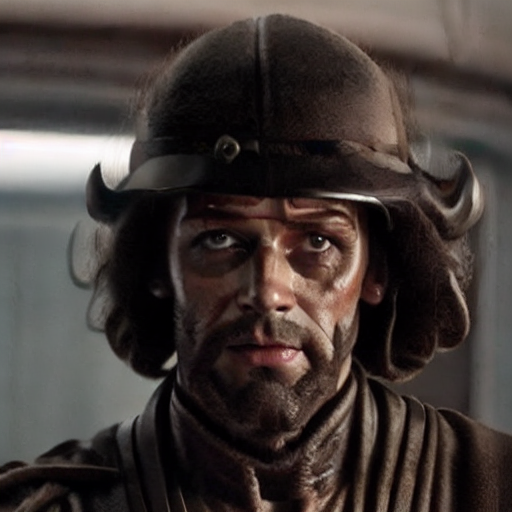

alpha: 0.5683720297393826


  0%|          | 0/16 [00:00<?, ?it/s]

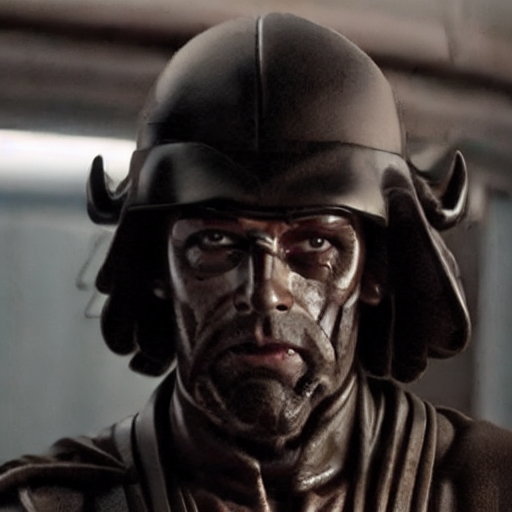

alpha: 0.5801743570511964


  0%|          | 0/16 [00:00<?, ?it/s]

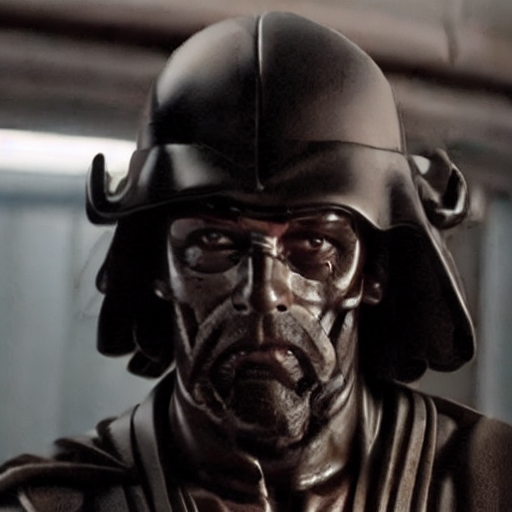

alpha: 0.6064134597354967


  0%|          | 0/16 [00:00<?, ?it/s]

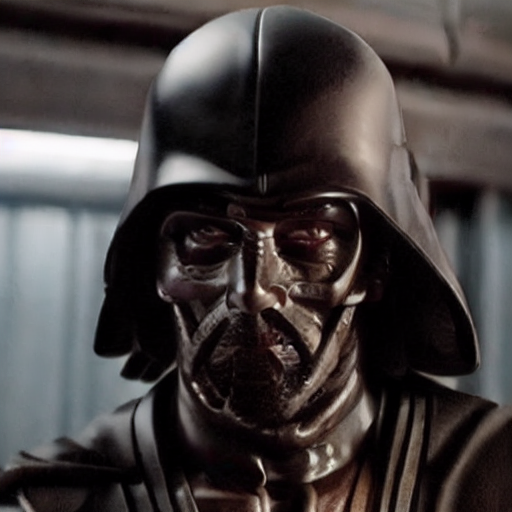

alpha: 0.6402373030394775


  0%|          | 0/16 [00:00<?, ?it/s]

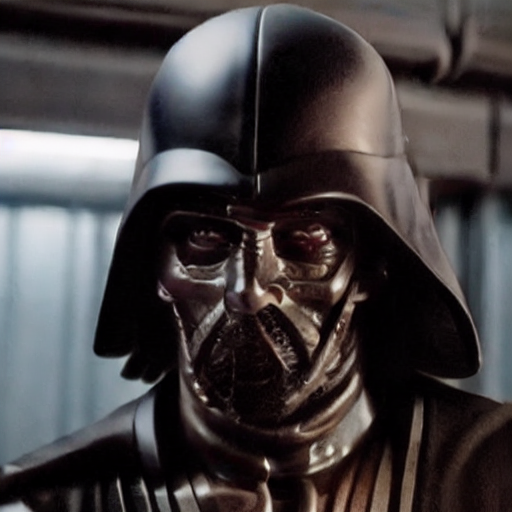

alpha: 0.6683437637395183


  0%|          | 0/16 [00:00<?, ?it/s]

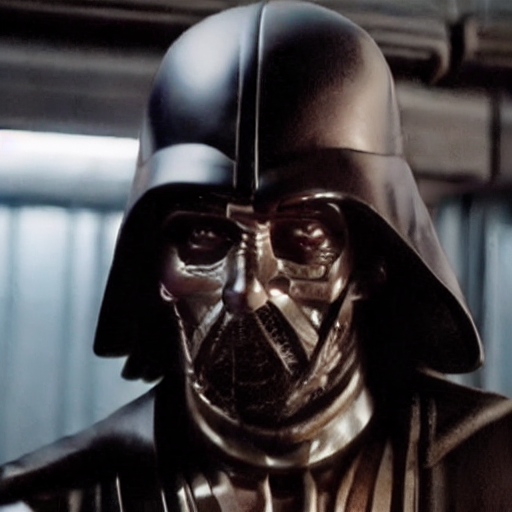

alpha: 0.6994365358889384


  0%|          | 0/16 [00:00<?, ?it/s]

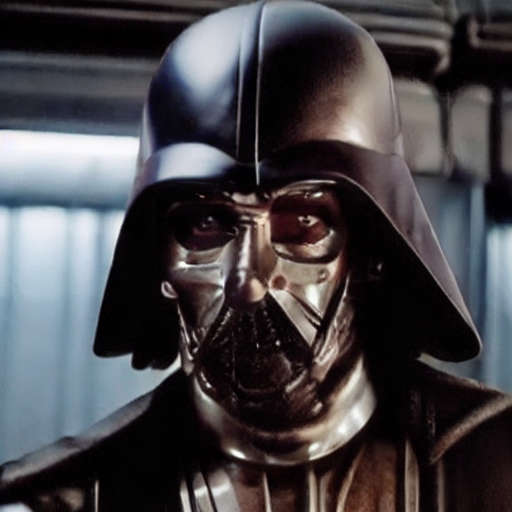

alpha: 0.7417032730295565


  0%|          | 0/16 [00:00<?, ?it/s]

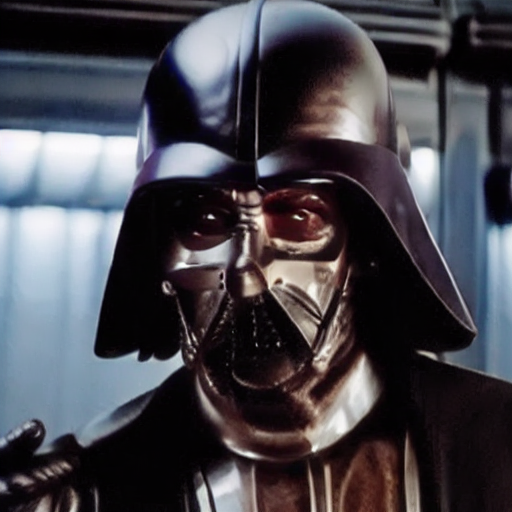

alpha: 0.8062774547721674


  0%|          | 0/16 [00:00<?, ?it/s]

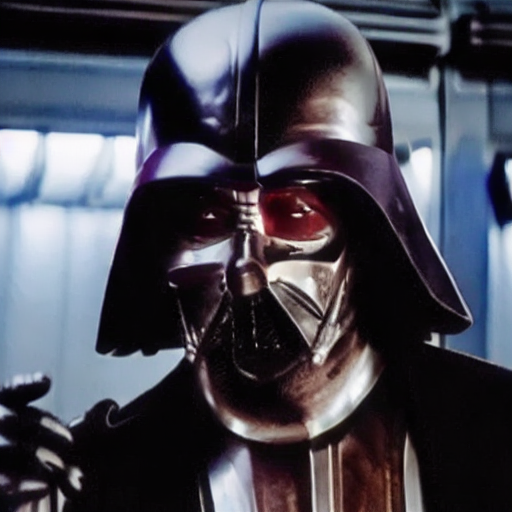

alpha: 0.9757846818465209


  0%|          | 0/16 [00:00<?, ?it/s]

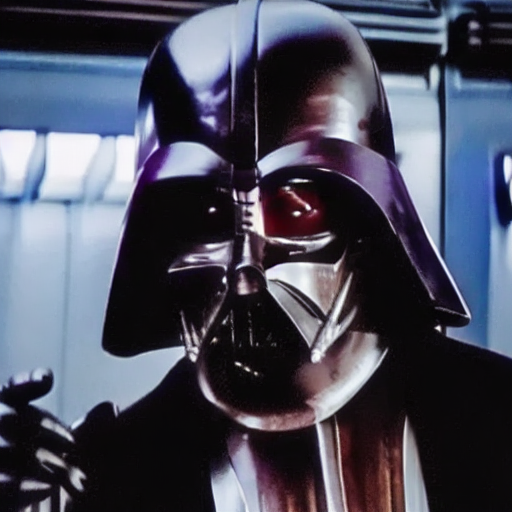

alpha: 1


  0%|          | 0/16 [00:00<?, ?it/s]

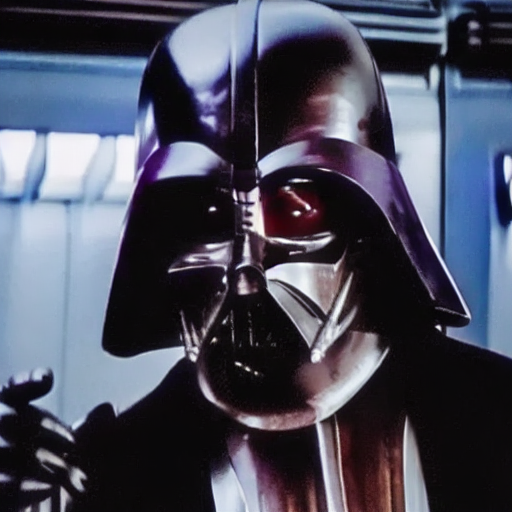

In [43]:
# Lerp embedding, slerp noise
img_seqence_xT_slerp = []

for alpha_i in alpha_list:
    alpha = alpha_i
    new_emb = alpha * emb_2 + (1 - alpha) * emb_1
    scale = max_scale - np.abs(alpha - 0.5) * (max_scale-min_scale) * 2.0
    #start_code = alpha*start_code1 + (1-alpha)*start_code2
    start_code = slerp(alpha, start_code1, start_code2)
    print('alpha:', alpha)
    x0 = pipe.backward_diffusion(
    latents=start_code,
    text_embeddings=new_emb,
    guidance_scale=scale,
    num_inference_steps=sampling_steps,
    use_source_uncon=True
    )
    
    display(latents_to_imgs(x0)[0])
    img_seqence_xT_slerp.append(latents_to_imgs(x0)[0])

In [44]:
# see lpips distance between consecutive pairs of images wt binary search
for i in range(len(img_seqence_xT_slerp)-1):
    print(sampling_alpha.lpips_tensor(img_seqence_xT_slerp[i], img_seqence_xT_slerp[i+1]))

0.19532117
0.16491787
0.2218051
0.15376456
0.17410809
0.20075862
0.238808
0.12732098
0.2621194
0.16803466
0.124542564
0.19945318
0.20472807
0.20421232
0.18351826
0.007934644


In [45]:
for i, img in enumerate(img_seqence_xT_slerp):
    img.save(f'./{dir}/{i}.png')

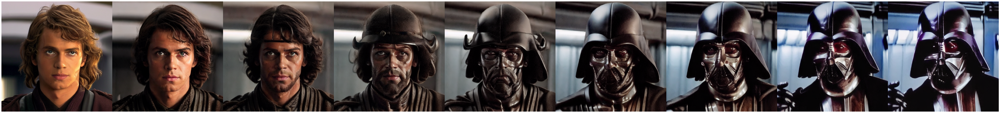

In [46]:
plt.figure(figsize=(100,10))
concat_img = img_seqence_xT_slerp[::2]
length_output = len(img_seqence_xT_slerp)
concat_img = np.concatenate(np.array([np.concatenate(concat_img[::1], axis=1)]), axis=0)
plt.imshow(concat_img)
plt.axis('off')
plt.savefig(f'./{dir}/{dir}_display.png',bbox_inches='tight')